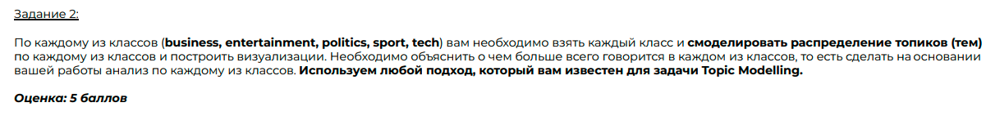

In [172]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
from pylab import pcolor, show, colorbar, xticks, yticks
import seaborn as sns
import sklearn
import torch
!pip install gensim
from gensim import corpora, models, similarities
!pip install pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import plotly.offline as py
import plotly.graph_objs as go
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import Normalizer
from sklearn.feature_extraction.text import *
from wordcloud import WordCloud
import time
import textwrap
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
from collections import defaultdict
from pprint import pprint
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer 
from nltk.tokenize import sent_tokenize, word_tokenize
import spacy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
!pip install watermark --quiet
%load_ext watermark
%watermark -a 'Anrei Sech' -v -p torch

     |████████████████████████████████| 1.6 MB 16.7 MB/s 
Author: Anrei Sech

Python implementation: CPython
Python version       : 3.7.14
IPython version      : 7.9.0

torch: 1.12.1+cu113



In [26]:
STOPWORDS = set(stopwords.words('english'))
RANDOM_SEED = 42
NUM_TOPICS = 5
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
DEVICE

device(type='cpu')

# Data Loading

In [4]:
from google.colab import drive
drive.mount('/drive')

Mounted at /drive


In [5]:
parent_folder = '/drive/My Drive/NLP/data/bbc/'

def extract_file_content(parent_folder):
    categories = []
    captions = []
    content = []
    file_names = []

    for folder in os.listdir(parent_folder):
        category = os.path.basename(folder)

        category_folder = os.path.join(parent_folder, folder)
        for file in os.listdir(category_folder):
            data = ''
            with open(os.path.join(category_folder, file), mode='r', encoding='utf8', errors='ignore') as f:
                file_content = f.readlines()
                caption = file_content[0]
                data = file_content
                data = ' '.join(data)
            categories.append(category)
            captions.append(caption)
            content.append(data)
            file_names.append(os.path.basename(file))

    return categories, captions, content, file_names

In [6]:
categories, captions, full_content, file_names = extract_file_content(parent_folder)
data_dict = { 'category' : categories, 'filename' : file_names, 'caption' : captions, 'news': full_content }
df = pd.DataFrame(data_dict)
df.to_csv('./bbc.csv')
df.head()

,category,filename,caption,news
0,business,001.txt,Ad sales boost Time Warner profit\n,Ad sales boost Time Warner profit\n \n Quarter...
1,business,004.txt,High fuel prices hit BA's profits\n,High fuel prices hit BA's profits\n \n British...
2,business,002.txt,Dollar gains on Greenspan speech\n,Dollar gains on Greenspan speech\n \n The doll...
3,business,003.txt,Yukos unit buyer faces loan claim\n,Yukos unit buyer faces loan claim\n \n The own...
4,business,006.txt,Japan narrowly escapes recession\n,Japan narrowly escapes recession\n \n Japan's ...


category
business         510
entertainment    386
politics         417
sport            511
tech             401
Name: news, dtype: int64


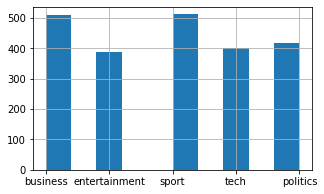

In [28]:
print(df.groupby('category')['news'].count())
df["category"].hist(figsize=(5,3));
categories = df["category"].unique().tolist()

# Data Prepocessing

In [278]:
def tokenize_sent(text):

    # tokenizing sentences
    text = sent_tokenize(text.split('\n', 1)[0])
    #textwrap.fill(text, replace_whitespace=False, fix_sentence_endings=True)
    return text[0]

def clean_data(text, stopwords = STOPWORDS):
    # to lower case and removing punctuation
    text = text.lower()
    text = re.sub('[^\w\s]','', text)

    # tokenizing and removing stop words
    words = [w for w in word_tokenize(text) if w not in stopwords]
    return ' '.join(words)

nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

def lemmatize(text):
    doc = nlp(text)
    my_extra_stop_words = {'say', 'may', 'go', 'make', 'use'}
    return ' '.join([token.lemma_ for token in doc if token.lemma_ not in my_extra_stop_words])

In [279]:
df['text'] = df['news'].map(clean_data)
df['text'] = df['text'].map(lemmatize)
freq = pd.Series(' '.join(df['text']).split()).value_counts()
high_freq_words = list(freq[freq > 1].index.values)
df['text'] = df['text'].apply(lambda x: ' '.join([word for word in x.split() if word in high_freq_words]))

In [263]:
df['sentence'] = df['news'].map(tokenize_sent)

In [280]:
df[['sentence', 'text']].head()

,sentence,text
0,Ad sales boost Time Warner profit,ad sale boost time warner profit quarterly pro...
1,High fuel prices hit BA's profits,high fuel price hit bas profits british airway...
2,Dollar gains on Greenspan speech,dollar gain greenspan speech dollar hit high l...
3,Yukos unit buyer faces loan claim,yukos unit buyer face loan claim owner embattl...
4,Japan narrowly escapes recession,japan narrowly escape recession japan economy ...


# Topic Modelling


In [418]:
vectorizer = TfidfVectorizer(stop_words=stopwords.words("english"), norm="l1")

def get_sentence_score(tfidf_row):
    # returns the average of non-zero elements of the tf-idf vector representation
    x = tfidf_row[tfidf_row != 0]
    return x.mean()

def get_summary(text):
    scores = np.zeros(len(text))
    encoded_text = vectorizer.fit_transform(text)

    for i in range(len(text)):
        score = get_sentence_score(encoded_text[i, :])
        scores[i] = score

    sort_idx = np.argsort(-scores)

    for i in sort_idx[:5]:
        print(textwrap.fill("%.2f: %s " % (scores[i], text.iloc[i])))
    return None

def lci_topic_modeling(corpus, dictionary):
    lsi = models.LsiModel(corpus=corpus, id2word=dictionary, num_topics=NUM_TOPICS, power_iters=5)
    pprint(lsi.show_topics(num_topics=-1, num_words=8, log=False, formatted=True))

    corpus_lsi = lsi[corpus]
    index = similarities.MatrixSimilarity(lsi[corpus])
    sims = index[corpus_lsi]
    sims  = (sims + 1)/2.
    
    plt.figure(figsize = (10,10))
    sns.heatmap(data=sims, cmap = 'Spectral').set(xticklabels=[], yticklabels=[])
    plt.title("Matrix Similarity")
    plt.show()
    return lsi, corpus_lsi

def principal_components(df, lsi, corpus):
    X = [0] * len(df)
    Y = [0] * len(df)
    
    for i in range(len(df)):
        vec = corpus[i]
        LSI_topics = lsi[vec]
        for topic in LSI_topics[:2]:
            if topic[0] == 0:
                X[i] = float(topic[1])
            elif topic[0] == 1:
                Y[i] = float(topic[1])
    vis_df = pd.DataFrame({'X': X, 'Y': Y, 'topic' : df.sentence })
    plt.figure(figsize=(20, 15))
    sns.FacetGrid(vis_df, hue='topic').map(plt.scatter, "X", "Y").add_legend()
    plt.show()
    return vis_df

def lda_topic_modeling(corpus, dictionary):
    lda_model = models.LdaModel(corpus=corpus, id2word=dictionary, 
                                num_topics=NUM_TOPICS, alpha='auto', eta='auto',
                                iterations=20, passes=5)
    pprint(lda_model.print_topics(num_topics=NUM_TOPICS))
    return lda_model

def lda_visualize(lda, corpus, dictionary):
    plt.figure(figsize=(20, 15))
    vis_data = gensimvis.prepare(lda, corpus, dictionary)
    pyLDAvis.display(vis_data)
    plt.show()

def show_word_cloud(texts):
    wordcloud = WordCloud(width = 500, height = 500, 
                background_color ='white', 
                min_font_size = 10).generate(' '.join([' '.join(text) for text in texts]))
    
    plt.figure(figsize = (5, 5), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show() 

In [419]:
import plotly.offline as py
import plotly.graph_objs as go

py.init_notebook_mode()

def plot_difference(mdiff, title="", annotation=None):
    annotation_html = None
    if annotation is not None:
        annotation_html = [
            [
                "+++ {}<br>--- {}".format(", ".join(int_tokens), ", ".join(diff_tokens))
                for (int_tokens, diff_tokens) in row
            ]
            for row in annotation
        ]

    data = go.Heatmap(z=mdiff, colorscale='RdBu', text=annotation_html)
    layout = go.Layout(width=500, height=500, title=title, xaxis=dict(title="topic"), yaxis=dict(title="topic"))
    py.iplot(dict(data=[data], layout=layout))

In [420]:
def tsne(df):
    vectors = TfidfVectorizer().fit_transform(df.text)
    X_reduced = TruncatedSVD(n_components=5, random_state=0).fit_transform(vectors)
    X_embedded = TSNE(n_components=2, perplexity=5, verbose=0).fit_transform(X_reduced)

    vis_df = pd.DataFrame({'X': X_embedded[:, 0], 'Y': X_embedded[:, 1], 'topic' : df.sentence})
    sns.FacetGrid(vis_df, hue="topic").map(plt.scatter, "X", "Y").add_legend()
    plt.show()

In [421]:
def topics_by_category(category):
    sub_df = df[df['category'] == category]
    
    print('*** Topic Modeling for `{}` category ***'.format(category))
    
    print(' -= Summary =- ')
    get_summary(sub_df['sentence'])
    print('-'*50)

    print('-= LSI Model =-')
    texts = [sub_df['text'].iloc[i].split() for i in range(len(sub_df))]
    dictionary = corpora.Dictionary(texts)
    corpus = [dictionary.doc2bow(text) for text in texts]
    tfidf = models.TfidfModel(corpus)
    #corpus_tfidf = tfidf[corpus]
    lsi, corpus_lsi = lci_topic_modeling(corpus, dictionary)
    print('-'*50)

    print('-= Principal Components =-')
    vis_df = principal_components(sub_df, lsi, corpus_lsi)
    
    print('-= LDA Model =-')
    lda = lda_topic_modeling(corpus, dictionary)
    lda_visualize(lda, corpus, dictionary)

    mdiff, annotation = lda.diff(lda, distance='jaccard', num_words=50)
    plot_difference(mdiff, title="Topic difference (one model) [jaccard distance]", annotation=annotation)

    print('-= TSNE =-')
    tsne(sub_df)

    print('-= Word Cloud =-')
    show_word_cloud(texts)
    print('-'*50)

*** Topic Modeling for `business` category ***
 -= Summary =- 
0.33: Quiksilver moves for Rossignol
0.33: S Korean consumers spending again
0.33: Singapore growth at 8.1% in 2004
0.33: Wipro beats forecasts once again
0.33: Parmalat to return to stockmarket
--------------------------------------------------
-= LSI Model =-


[(0,
  '0.272*"year" + 0.185*"we" + 0.185*"mr" + 0.164*"company" + 0.160*"market" + '
  '0.151*"firm" + 0.143*"rise" + 0.139*"would"'),
 (1,
  '0.286*"mr" + 0.254*"yukos" + 0.228*"company" + -0.225*"rise" + '
  '-0.214*"rate" + 0.207*"firm" + -0.200*"growth" + -0.183*"economy"'),
 (2,
  '-0.417*"yukos" + 0.377*"mr" + -0.243*"oil" + -0.205*"russian" + '
  '-0.177*"sale" + -0.158*"gazprom" + 0.151*"glazer" + -0.147*"court"'),
 (3,
  '0.303*"m" + 0.266*"sale" + -0.236*"mr" + 0.218*"share" + -0.217*"economy" + '
  '-0.212*"economic" + 0.196*"profit" + -0.178*"government"'),
 (4,
  '-0.437*"mr" + -0.230*"price" + -0.195*"glazer" + -0.193*"rise" + '
  '-0.165*"rate" + 0.162*"country" + -0.147*"club" + 0.125*"m"')]


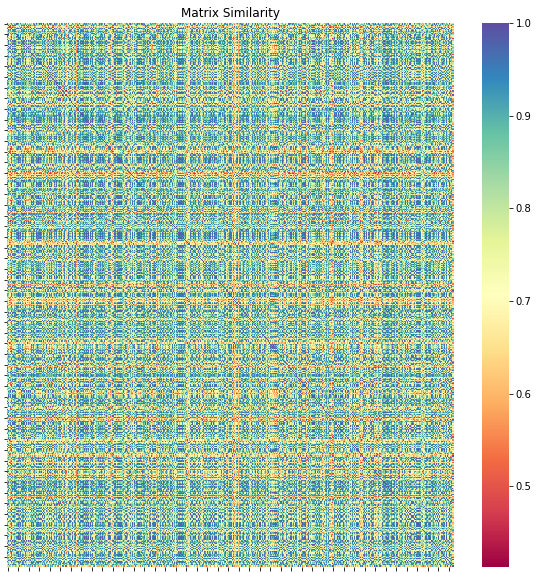

--------------------------------------------------
-= Principal Components =-


<Figure size 1440x1080 with 0 Axes>

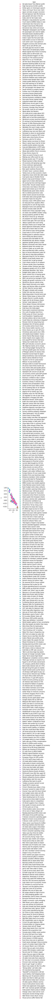

-= LDA Model =-
[(0,
  '0.011*"year" + 0.009*"rise" + 0.009*"rate" + 0.008*"economy" + '
  '0.008*"growth" + 0.007*"price" + 0.006*"bank" + 0.006*"fall" + 0.006*"we" + '
  '0.006*"market"'),
 (1,
  '0.007*"year" + 0.006*"would" + 0.006*"company" + 0.005*"firm" + '
  '0.005*"share" + 0.005*"new" + 0.005*"market" + 0.005*"m" + 0.004*"we" + '
  '0.004*"also"'),
 (2,
  '0.009*"firm" + 0.008*"sale" + 0.007*"year" + 0.007*"m" + 0.007*"we" + '
  '0.007*"company" + 0.006*"share" + 0.006*"market" + 0.005*"new" + '
  '0.004*"mr"'),
 (3,
  '0.011*"mr" + 0.008*"company" + 0.006*"year" + 0.005*"oil" + 0.005*"m" + '
  '0.005*"firm" + 0.004*"government" + 0.004*"would" + 0.004*"yukos" + '
  '0.004*"bank"'),
 (4,
  '0.007*"mr" + 0.006*"year" + 0.005*"we" + 0.005*"company" + 0.005*"m" + '
  '0.004*"bank" + 0.004*"firm" + 0.004*"united" + 0.004*"market" + '
  '0.004*"glazer"')]


<Figure size 1440x1080 with 0 Axes>

-= TSNE =-


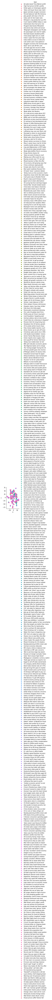

-= Word Cloud =-


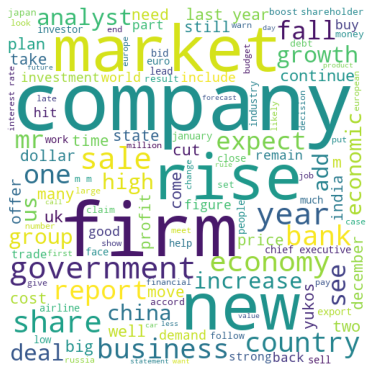

--------------------------------------------------


In [422]:
topics_by_category(categories[0])

*** Topic Modeling for `entertainment` category ***
 -= Summary =- 
0.50: 'My memories of Marley...'
0.33: Redford's vision of Sundance
0.33: Eurovision 'greats' to do battle
0.33: No charges against TV's Cosby
0.33: Fightstar take to the stage
--------------------------------------------------
-= LSI Model =-


[(0,
  '0.390*"good" + 0.312*"song" + 0.302*"music" + 0.230*"year" + 0.215*"not" + '
  '0.194*"award" + 0.166*"film" + 0.153*"do"'),
 (1,
  '0.564*"film" + -0.296*"music" + -0.232*"song" + 0.161*"actor" + '
  '-0.161*"urban" + 0.151*"director" + 0.149*"star" + 0.134*"m"'),
 (2,
  '-0.472*"music" + 0.396*"song" + -0.349*"urban" + 0.276*"good" + 0.178*"25" '
  '+ -0.177*"black" + -0.162*"s" + 0.157*"angel"'),
 (3,
  '-0.300*"good" + 0.286*"m" + 0.214*"show" + -0.190*"award" + -0.181*"film" + '
  '-0.171*"urban" + 0.160*"chart" + 0.147*"new"'),
 (4,
  '-0.700*"m" + 0.259*"show" + -0.161*"film" + -0.146*"box" + -0.132*"office" '
  '+ -0.128*"take" + 0.105*"also" + 0.103*"band"')]


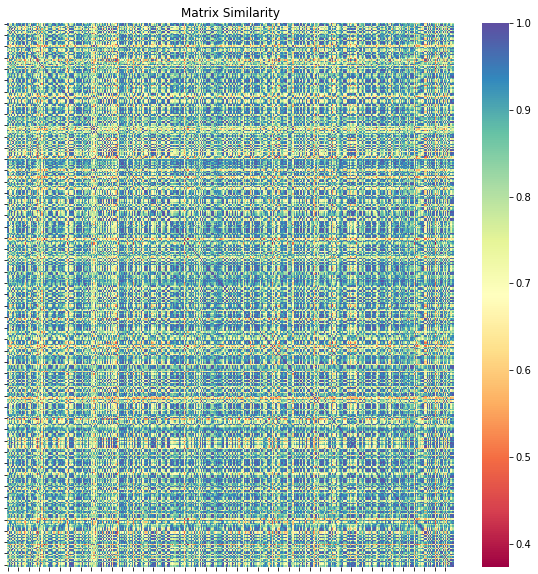

--------------------------------------------------
-= Principal Components =-


<Figure size 1440x1080 with 0 Axes>

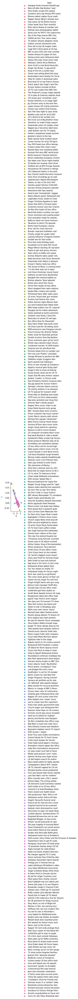

-= LDA Model =-
[(0,
  '0.009*"film" + 0.008*"award" + 0.006*"good" + 0.006*"year" + '
  '0.005*"include" + 0.005*"also" + 0.004*"show" + 0.004*"one" + 0.004*"new" + '
  '0.003*"book"'),
 (1,
  '0.015*"film" + 0.014*"good" + 0.010*"award" + 0.008*"star" + 0.007*"actor" '
  '+ 0.006*"year" + 0.006*"oscar" + 0.006*"director" + 0.005*"also" + '
  '0.005*"actress"'),
 (2,
  '0.019*"film" + 0.016*"m" + 0.007*"year" + 0.007*"show" + 0.007*"star" + '
  '0.005*"take" + 0.004*"last" + 0.004*"one" + 0.004*"box" + 0.004*"also"'),
 (3,
  '0.012*"music" + 0.010*"good" + 0.006*"not" + 0.006*"year" + 0.006*"show" + '
  '0.006*"award" + 0.005*"film" + 0.005*"people" + 0.005*"song" + 0.005*"do"'),
 (4,
  '0.008*"year" + 0.007*"band" + 0.006*"music" + 0.006*"show" + 0.006*"new" + '
  '0.005*"film" + 0.005*"we" + 0.005*"one" + 0.004*"top" + 0.004*"also"')]


<Figure size 1440x1080 with 0 Axes>

-= TSNE =-


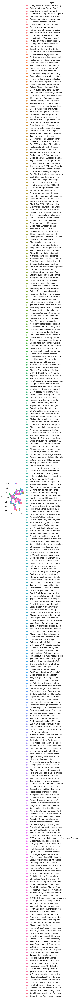

-= Word Cloud =-


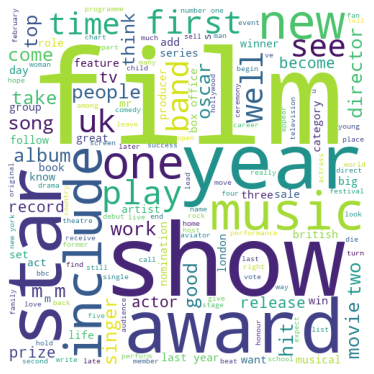

--------------------------------------------------


In [423]:
topics_by_category(categories[1])

*** Topic Modeling for `sport` category ***
 -= Summary =- 
0.50: What now for British tennis?
0.50: A November to remember
0.50: Hearts 2-1 Livingston
0.50: Hereford 1-1 Doncaster
0.50: Brentford v Southampton
--------------------------------------------------
-= LSI Model =-


[(0,
  '0.215*"game" + 0.200*"m" + 0.193*"win" + 0.163*"play" + 0.159*"not" + '
  '0.153*"first" + 0.142*"england" + 0.138*"get"'),
 (1,
  '0.500*"roddick" + 0.417*"nadal" + 0.231*"point" + -0.218*"m" + '
  '0.188*"serve" + 0.173*"break" + 0.173*"game" + 0.158*"set"'),
 (2,
  '-0.403*"m" + 0.263*"england" + 0.237*"wale" + -0.200*"roddick" + '
  '0.169*"ireland" + 0.166*"zealand" + -0.161*"nadal" + 0.149*"side"'),
 (3,
  '-0.328*"m" + 0.235*"would" + 0.233*"liverpool" + 0.190*"club" + '
  '0.184*"gerrard" + 0.180*"parry" + 0.166*"not" + -0.161*"second"'),
 (4,
  '-0.457*"new" + -0.375*"zealand" + -0.223*"wale" + 0.214*"england" + '
  '-0.207*"black" + -0.144*"tour" + -0.122*"rugby" + -0.114*"m"')]


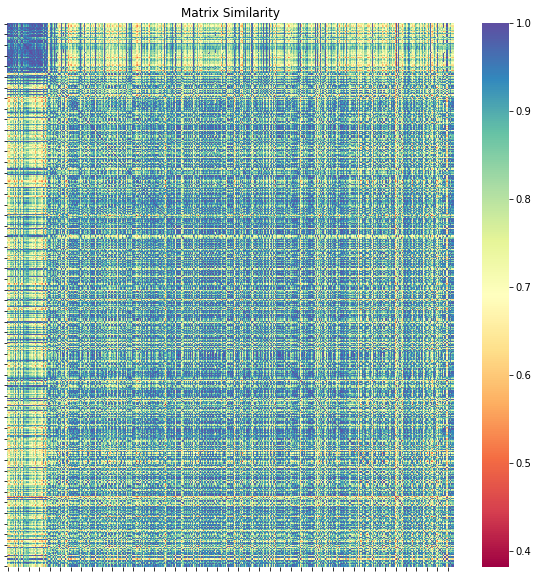

--------------------------------------------------
-= Principal Components =-


<Figure size 1440x1080 with 0 Axes>

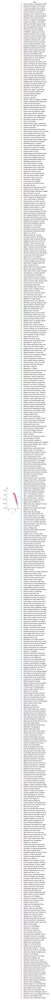

-= LDA Model =-
[(0,
  '0.007*"game" + 0.006*"united" + 0.006*"play" + 0.005*"arsenal" + '
  '0.005*"goal" + 0.005*"chelsea" + 0.005*"win" + 0.005*"not" + 0.004*"good" + '
  '0.004*"get"'),
 (1,
  '0.011*"england" + 0.008*"game" + 0.007*"ireland" + 0.006*"france" + '
  '0.005*"play" + 0.005*"wale" + 0.005*"six" + 0.005*"win" + 0.004*"also" + '
  '0.004*"try"'),
 (2,
  '0.008*"player" + 0.008*"would" + 0.007*"not" + 0.006*"get" + 0.005*"m" + '
  '0.005*"club" + 0.005*"game" + 0.004*"play" + 0.004*"good" + 0.004*"do"'),
 (3,
  '0.011*"m" + 0.008*"win" + 0.007*"world" + 0.006*"year" + 0.006*"game" + '
  '0.006*"first" + 0.005*"second" + 0.004*"race" + 0.004*"one" + '
  '0.004*"england"'),
 (4,
  '0.010*"play" + 0.007*"not" + 0.007*"win" + 0.005*"do" + 0.005*"m" + '
  '0.005*"last" + 0.005*"year" + 0.005*"world" + 0.005*"well" + 0.005*"first"')]


<Figure size 1440x1080 with 0 Axes>

-= TSNE =-


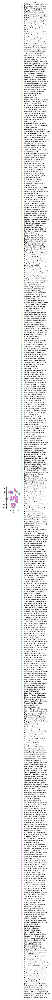

-= Word Cloud =-


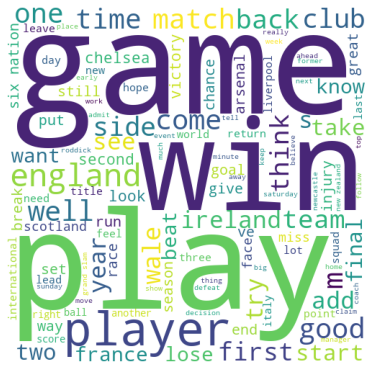

--------------------------------------------------


In [424]:
topics_by_category(categories[2])

*** Topic Modeling for `tech` category ***
 -= Summary =- 
1.00: Who do you think you are?
0.50: The future in your pocket
0.50: Be careful how you code
0.33: Software watching while you work
0.33: Software watching while you work
--------------------------------------------------
-= LSI Model =-


[(0,
  '0.275*"game" + 0.256*"people" + 0.194*"mobile" + 0.166*"phone" + '
  '0.165*"technology" + 0.143*"get" + 0.132*"one" + 0.130*"also"'),
 (1,
  '-0.718*"game" + -0.210*"play" + 0.184*"phone" + 0.183*"mobile" + '
  '0.151*"service" + -0.121*"time" + -0.112*"hour" + 0.107*"user"'),
 (2,
  '0.529*"mobile" + 0.376*"phone" + -0.181*"site" + -0.167*"software" + '
  '-0.150*"search" + -0.144*"user" + -0.141*"net" + -0.123*"computer"'),
 (3,
  '0.322*"phone" + -0.209*"music" + 0.205*"mobile" + -0.203*"technology" + '
  '-0.195*"digital" + -0.160*"player" + 0.159*"site" + -0.150*"device"'),
 (4,
  '0.242*"broadband" + 0.237*"service" + -0.229*"gadget" + 0.222*"tv" + '
  '-0.206*"apple" + -0.199*"pc" + -0.166*"phone" + -0.165*"computer"')]


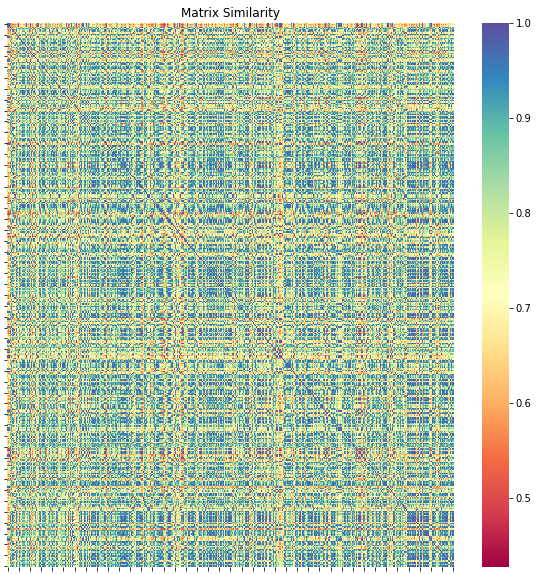

--------------------------------------------------
-= Principal Components =-


<Figure size 1440x1080 with 0 Axes>

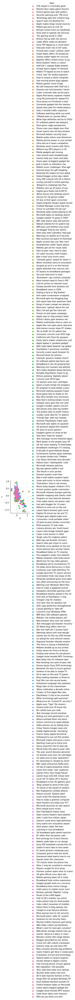

-= LDA Model =-
[(0,
  '0.007*"people" + 0.006*"computer" + 0.005*"site" + 0.005*"new" + '
  '0.005*"user" + 0.005*"one" + 0.004*"software" + 0.004*"would" + '
  '0.004*"many" + 0.004*"machine"'),
 (1,
  '0.011*"mobile" + 0.009*"people" + 0.009*"phone" + 0.007*"service" + '
  '0.006*"broadband" + 0.006*"tv" + 0.006*"game" + 0.005*"technology" + '
  '0.005*"also" + 0.005*"year"'),
 (2,
  '0.012*"game" + 0.010*"music" + 0.007*"mobile" + 0.007*"technology" + '
  '0.007*"people" + 0.006*"year" + 0.006*"phone" + 0.005*"player" + '
  '0.005*"also" + 0.005*"would"'),
 (3,
  '0.007*"people" + 0.007*"system" + 0.007*"software" + 0.006*"user" + '
  '0.006*"firm" + 0.006*"security" + 0.005*"program" + 0.005*"virus" + '
  '0.004*"email" + 0.004*"could"'),
 (4,
  '0.008*"people" + 0.006*"game" + 0.006*"technology" + 0.006*"search" + '
  '0.005*"mr" + 0.005*"could" + 0.005*"one" + 0.005*"would" + 0.004*"computer" '
  '+ 0.004*"new"')]


<Figure size 1440x1080 with 0 Axes>

-= TSNE =-


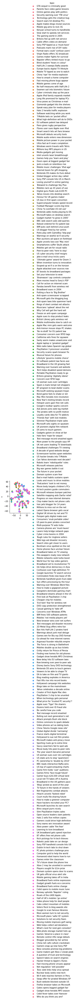

-= Word Cloud =-


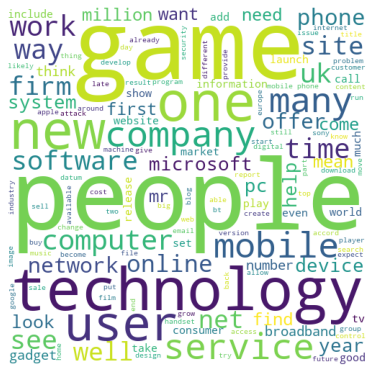

--------------------------------------------------


In [425]:
topics_by_category(categories[3])

*** Topic Modeling for `politics` category ***
 -= Summary =- 
0.50: 'More to do' on adult literacy
0.50: Goldsmith: 'I was not leant on'
0.50: 'No more concessions' on terror
0.50: What the election should really be about?
0.33: Labour's Cunningham to stand down
--------------------------------------------------
-= LSI Model =-


[(0,
  '0.440*"mr" + 0.243*"would" + 0.203*"government" + 0.188*"people" + '
  '0.186*"labour" + 0.169*"party" + 0.148*"election" + 0.146*"blair"'),
 (1,
  '-0.432*"wage" + -0.335*"minimum" + -0.306*"increase" + 0.290*"mr" + '
  '-0.261*"pay" + -0.175*"business" + -0.164*"people" + -0.149*"work"'),
 (2,
  '-0.231*"government" + -0.220*"forsyth" + -0.215*"terrorist" + 0.192*"party" '
  '+ 0.188*"election" + -0.179*"threat" + 0.178*"labour" + 0.167*"wage"'),
 (3,
  '0.547*"party" + 0.327*"kilroysilk" + 0.299*"ukip" + -0.249*"mr" + '
  '-0.222*"blair" + -0.185*"brown" + -0.145*"minister" + 0.120*"vote"'),
 (4,
  '-0.352*"would" + 0.342*"mr" + -0.209*"plan" + -0.198*"lord" + 0.160*"blair" '
  '+ -0.152*"tory" + 0.151*"forsyth" + 0.131*"brown"')]


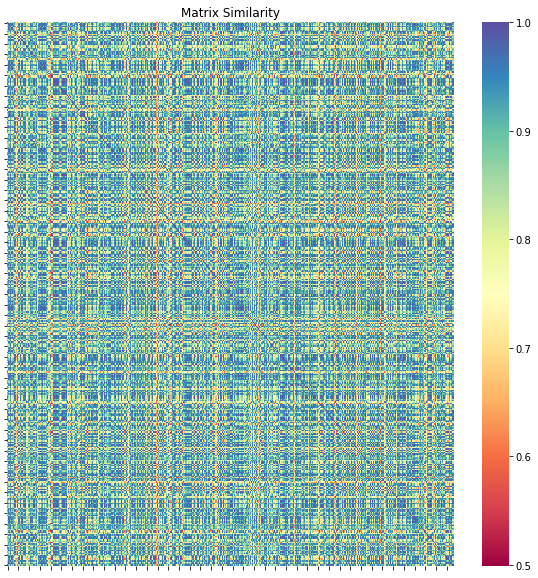

--------------------------------------------------
-= Principal Components =-


<Figure size 1440x1080 with 0 Axes>

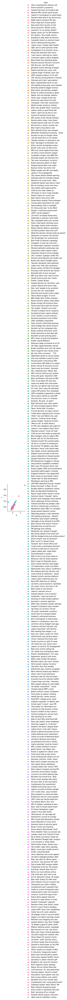

-= LDA Model =-
[(0,
  '0.022*"mr" + 0.013*"labour" + 0.011*"election" + 0.011*"blair" + '
  '0.010*"party" + 0.009*"would" + 0.006*"minister" + 0.006*"brown" + '
  '0.006*"tory" + 0.006*"people"'),
 (1,
  '0.013*"mr" + 0.012*"would" + 0.007*"party" + 0.007*"tory" + 0.007*"people" '
  '+ 0.006*"government" + 0.006*"labour" + 0.006*"plan" + 0.005*"also" + '
  '0.005*"year"'),
 (2,
  '0.013*"mr" + 0.008*"government" + 0.008*"would" + 0.006*"election" + '
  '0.006*"minister" + 0.005*"labour" + 0.005*"public" + 0.004*"year" + '
  '0.004*"people" + 0.004*"new"'),
 (3,
  '0.012*"mr" + 0.006*"would" + 0.006*"minister" + 0.005*"government" + '
  '0.005*"police" + 0.005*"law" + 0.004*"people" + 0.004*"blair" + '
  '0.004*"also" + 0.004*"hunt"'),
 (4,
  '0.009*"would" + 0.008*"mr" + 0.008*"government" + 0.006*"people" + '
  '0.006*"uk" + 0.006*"lord" + 0.005*"eu" + 0.005*"right" + 0.004*"also" + '
  '0.004*"britain"')]


<Figure size 1440x1080 with 0 Axes>

-= TSNE =-


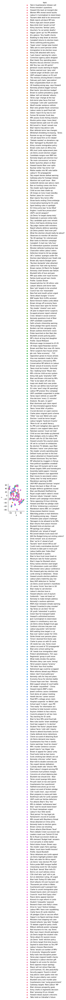

-= Word Cloud =-


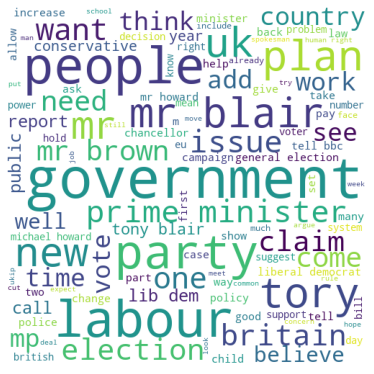

--------------------------------------------------


In [426]:
topics_by_category(categories[4])